In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import random
import ssl
import cv2
import numpy as np
import imageio
from IPython import display
from urllib import request
import re
import tempfile
import pandas as pd
from keras import backend as K
import sys
import csv
import os
import cv2
import math
import datetime as dt
from collections import deque
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50
from google.colab import drive
import gc


In [ ]:
!pip install imageio-ffmpeg

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
data_root = '/content/drive/MyDrive/sportals/dataset/'
train_dataset_file = '/content/drive/MyDrive/sportals/dataset/train/dataset.csv'
test_dataset_file = '/content/drive/MyDrive/sportals/dataset/test/dataset.csv'
folder_root = '/content/drive/MyDrive/sportals/'

In [ ]:
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
UCF_ROOT = "https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/"
_VIDEO_LIST = None
Videos ={}
_CACHE_DIR = tempfile.mkdtemp()
unverified_context = ssl._create_unverified_context()
# os.mkdir(folder_root)
# os.mkdir(data_root)
v = ["Good_Clips", "Bad_Clips"] # make changes here to use different video classes
for classname in v:
  pass
  # os.mkdir(data_root+classname)
print('The directory structure is created is created.')
def list_ucf_videos():
  global _VIDEO_LIST
  if not _VIDEO_LIST:
    index = request.urlopen(UCF_ROOT, context=unverified_context).read().decode("utf-8")
    
    for i in v:
      s = "(v_"+str(i)+"[\w_]+\.mp4)"
      videos = re.findall(s, index)
      Videos[i]=sorted(set(videos))
  return Videos

The directory structure is created is created.


In [ ]:
unverified_context = ssl._create_unverified_context()
def fetch_ucf_video(video):
  cache_path = os.path.join(_CACHE_DIR, video)
  if not os.path.exists(cache_path):
    urlpath = request.urljoin(UCF_ROOT, video)
    print("Fetching %s => %s" % (urlpath, cache_path))
    data = request.urlopen(urlpath, context=unverified_context).read()
    open(cache_path, "wb").write(data)
  return cache_path

In [ ]:
UCF_ROOT = "https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/"

V={}
unverified_context = ssl._create_unverified_context()
V = list_ucf_videos()
for i,value in V.items():
  _VIDEO_LIST = V[i]
  _CACHE_DIR = "/content/drive/MyDrive/sportals/dataset" + str(i) + "/"
  for j in _VIDEO_LIST:  
    video_path = fetch_ucf_video(j)

In [ ]:
classes = ["Good_Clips", "Bad_Clips"] # update this when you change the classes

with open(train_dataset_file, 'w', newline='') as file:
  writer = csv.writer(file)
  for c in classes:
    path = os.path.join(data_root+'train/', c+"/")
    for i in os.listdir(path):
      writer.writerow([classes.index(c), os.path.join(path, i)])

with open(test_dataset_file, 'w', newline='') as file:
  writer = csv.writer(file)
  for c in classes:
    path = os.path.join(data_root+'test/', c+"/")
    for i in os.listdir(path):
      writer.writerow([classes.index(c), os.path.join(path, i)])

In [ ]:
# shuffle
df_train = pd.read_csv(data_root+'train/'+'dataset.csv')
df_train = df_train.sample(frac=1)
df_train.to_csv(data_root+'train/'+'dataset.csv', index=False)

df_test = pd.read_csv(data_root+'test/'+'dataset.csv')
df_test = df_test.sample(frac=1)
df_test.to_csv(data_root+'test/'+'dataset.csv', index=False)


In [ ]:
# split the data into train and test
import numpy as np
df_train = pd.read_csv(data_root+'train/'+'dataset.csv', header=None)
df_train.columns = ["class", "path"]
df_train = df_train.astype({"class": str})
train = df_train

df_test = pd.read_csv(data_root+'test/'+'dataset.csv', header=None)
df_test.columns = ["class", "path"]
df_test = df_test.astype({"class": str})
test = df_test
#test = np.split(df.sample(frac=1, random_state=42), [int(.8*len(df))])

In [ ]:
train.to_pickle(data_root+'train/'+'train.pkl')
test.to_pickle(data_root+'test/'+'test.pkl')

In [ ]:
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 20
MAX_SEQ_LENGTH = 150
NUM_FEATURES = 2048

In [ ]:
train_df = train
test_df = test

print(f"Total videos for training: {len(train_df)}")
print(f"Total videos for testing: {len(test_df)}")

train_df.sample(10, replace=True)

Total videos for training: 43
Total videos for testing: 6


,class,path
9,0,/content/drive/MyDrive/sportals/dataset/train/...
10,0,/content/drive/MyDrive/sportals/dataset/train/...
36,0,/content/drive/MyDrive/sportals/dataset/train/...
9,0,/content/drive/MyDrive/sportals/dataset/train/...
13,1,/content/drive/MyDrive/sportals/dataset/train/...
14,0,/content/drive/MyDrive/sportals/dataset/train/...
31,0,/content/drive/MyDrive/sportals/dataset/train/...
1,1,/content/drive/MyDrive/sportals/dataset/train/...
29,1,/content/drive/MyDrive/sportals/dataset/train/...
7,1,/content/drive/MyDrive/sportals/dataset/train/...


In [ ]:
def crop_center_square(frame):
    y, x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y : start_y + min_dim, start_x : start_x + min_dim]


def load_video(path, max_frames=0, resize=(IMG_SIZE, IMG_SIZE)):
    cap = cv2.VideoCapture(path)
    #cap.set(cv2.CAP_PROP_POS_MSEC, 20000)
    frames = []
    j = 0
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]
            frames.append(frame)
            #cv2.imwrite(data_root+"/train/"+str(j)+".jpg", img)

            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)

In [ ]:
def build_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")


feature_extractor = build_feature_extractor()

In [ ]:
label_processor = keras.layers.experimental.preprocessing.StringLookup(
    num_oov_indices=0, vocabulary=np.unique(train_df["class"])
)
print(np.unique(train_df["class"]))
print(label_processor.get_vocabulary())

['0' '1']
['0', '1']


In [ ]:
gc.collect()

11923

In [ ]:
def prepare_all_videos(df):
    num_samples = len(df)
    video_paths = df["path"].values.tolist()
    labels = df["class"].values
    labels = label_processor(labels[..., None]).numpy()

    # `frame_masks` and `frame_features` are what we will feed to our sequence model.
    # `frame_masks` will contain a bunch of booleans denoting if a timestep is
    # masked with padding or not.
    frame_masks = np.zeros(shape=(num_samples, MAX_SEQ_LENGTH), dtype="bool")
    frame_features = np.zeros(
        shape=(num_samples, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
    )

    # For each video.
    for idx,path in enumerate(video_paths):
        # Gather all its frames and add a batch dimension.hike intern
        #path = video_paths[idx]
        frames = load_video(path)
        frames = frames[None, ...]

        gc.collect()

        # Initialize placeholders to store the masks and features of the current video.
        temp_frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
        temp_frame_featutes = np.zeros(
            shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
        )

        # Extract features from the frames of the current video.
        for i, batch in enumerate(frames):
            try:
              video_length = batch.shape[1]
              length = min(MAX_SEQ_LENGTH, video_length)
              for j in range(length):
                temp_frame_featutes[i, j, :] = feature_extractor.predict(
                    batch[None, j, :]
                )
              temp_frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked
              frame_features[idx,] = temp_frame_featutes.squeeze()
              frame_masks[idx,] = temp_frame_mask.squeeze()
            except:
              pass

        gc.collect()
        print(idx)

    return (frame_features, frame_masks), labels

gc.collect()

train_data, train_labels = prepare_all_videos(train_df)

print(f"Frame features in train set: {train_data[0].shape}")
print(f"Frame masks in train set: {train_data[1].shape}")

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
Frame features in train set: (34, 150, 2048)
Frame masks in train set: (34, 150)


In [ ]:
gc.collect()


22

In [ ]:
test_data, test_labels = prepare_all_videos(test_df)

0
1
2
3
4
5
6
7
8


In [ ]:
##################### Model Code V1

input_tensor = tf.keras.layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

base = ResNet50(weights="imagenet", include_top=False,input_tensor=input_tensor, input_shape=(IMG_SIZE, IMG_SIZE, 3))
# base.load_weights('resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5')

top = Dense(11, activation='softmax')(
            Dropout(0.5)(
                Dense(2048, activation='relu')(
                    Dropout(0.5)(
                        GlobalAveragePooling2D()(base.output)
                    )
                )
            )
        )

model = Model(input_tensor, top)
#####################################

# model = keras.Sequential()





In [ ]:
# Utility for our sequence model.
def get_sequence_model():
    class_vocab = label_processor.get_vocabulary()

    frame_features_input = keras.Input((MAX_SEQ_LENGTH, NUM_FEATURES))
    mask_input = keras.Input((MAX_SEQ_LENGTH,), dtype="bool")

    # Refer to the following tutorial to understand the significance of using `mask`:
    # https://keras.io/api/layers/recurrent_layers/gru/
    x = keras.layers.LSTM(200, return_sequences=True)(
        frame_features_input, mask=mask_input
    )

    x = keras.layers.LSTM(200, return_sequences=True)(x)

    x = keras.layers.GRU(20)(x)
    x = keras.layers.Dropout(0.4)(x)


    x = keras.layers.Dense(2048, activation="relu")(x)
    x = keras.layers.Dense(1024, activation="relu")(x)

    x = keras.layers.Dropout(0.4)(x)

    x = keras.layers.Dense(256, activation="relu")(x)
    x = keras.layers.Dense(256, activation="relu")(x)

    x = keras.layers.Dense(256, activation="relu")(x)
    x = keras.layers.Dense(256, activation="relu")(x)

    output = keras.layers.Dense(len(class_vocab), activation="softmax")(x)

    rnn_model = keras.Model([frame_features_input, mask_input], output)

    # rnn_model.compile(
    #     loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"]
    # )
    rnn_model.compile(optimizer=keras.optimizers.Adam(learning_rate=10e-4),loss = 'sparse_categorical_crossentropy',metrics = ['accuracy'])

    return rnn_model

In [ ]:
for layer in model.layers:
    layer.trainable = False

for i in range(-5, 0):
    model.layers[i].trainable = True

In [ ]:
# model.compile(keras.optimizers.Adam(learning_rate=10e-4),loss = 'categorical_crossentropy',metrics = ['accuracy'])


In [ ]:
gc.collect()


729

In [ ]:
# Utility for running experiments.
def run_training():
    filepath = "/tmp/video_classifier"
    checkpoint = keras.callbacks.ModelCheckpoint(
        filepath, save_weights_only=True, save_best_only=True, verbose=1
    )

    seq_model = get_sequence_model()
    #seq_model = model
    history = seq_model.fit(
        [train_data[0], train_data[1]],
        train_labels,
        validation_split=0.2,
        epochs=EPOCHS,
        callbacks=[checkpoint],
        batch_size=64
    )

    seq_model.load_weights(filepath)
    _, accuracy = seq_model.evaluate([test_data[0], test_data[1]], test_labels)
    print(f"Test accuracy: {accuracy * 100, 2}%")

    return history, seq_model


_, sequence_model = run_training()

Epoch 1/20
1/1 [==============================] - ETA: 0s - loss: 0.6932 - accuracy: 0.6296
Epoch 1: val_loss improved from inf to 0.70117, saving model to /tmp/video_classifier
1/1 [==============================] - 23s 23s/step - loss: 0.6932 - accuracy: 0.6296 - val_loss: 0.7012 - val_accuracy: 0.0000e+00
Epoch 2/20
1/1 [==============================] - ETA: 0s - loss: 0.6910 - accuracy: 0.6296
Epoch 2: val_loss improved from 0.70117 to 0.65650, saving model to /tmp/video_classifier
1/1 [==============================] - 2s 2s/step - loss: 0.6910 - accuracy: 0.6296 - val_loss: 0.6565 - val_accuracy: 1.0000
Epoch 3/20
1/1 [==============================] - ETA: 0s - loss: 0.6951 - accuracy: 0.4815
Epoch 3: val_loss improved from 0.65650 to 0.62782, saving model to /tmp/video_classifier
1/1 [==============================] - 2s 2s/step - loss: 0.6951 - accuracy: 0.4815 - val_loss: 0.6278 - val_accuracy: 1.0000
Epoch 4/20
1/1 [==============================] - ETA: 0s - loss: 0.6805 -

In [ ]:
sequence_model.save(folder_root+'/model/'+'saved_model_V2_ACC_77.7')


In [ ]:
sequence_model = keras.models.load_model(folder_root+'/model/'+'saved_model_V2_ACC_77.7')

In [ ]:
import imageio
# from tensorflow_docs.vis import embed

def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
    frame_featutes = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, batch in enumerate(frames):
        print(batch.shape[1])
        video_length = batch.shape[1]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_featutes[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_featutes, frame_mask


def sequence_prediction(path):
    class_vocab = label_processor.get_vocabulary()

    frames = load_video(os.path.join("test", path))
    frame_features, frame_mask = prepare_single_video(frames)
    probabilities = sequence_model.predict([frame_features, frame_mask])[0]
    v = ["Good_Clips", "Bad_Clips"]

    for i in np.argsort(probabilities)[::-1]:
        print(f"  {str(v[class_vocab[i].astype(int)])} :{class_vocab[i]}: {probabilities[i] * 100:5.2f}%")
        
    return frames

def frame_prediction(path, num_frames):
    class_vocab = label_processor.get_vocabulary()

    frames = load_video(os.path.join("test", path))
    print(f'Number of frames: {len(frames)}')
    result = []
    for j in range(len(frames)):
      if j % num_frames != 0 or j == 0:
        continue
      frame_features, frame_mask = prepare_single_video(frames[j-num_frames:j])
      probabilities = sequence_model.predict([frame_features, frame_mask])[0]
      v = ["Good_Clips", "Bad_Clips"]

      for i in np.argsort(probabilities)[::-1]:
          print(f"  {str(v[class_vocab[i].astype(int)])} :{class_vocab[i]}: {probabilities[i] * 100:5.2f}%")
      
      if (probabilities[0] * 100) > (probabilities[1] * 100):
        result.extend(frames[j-num_frames:j])

    return result

def to_mp4(frames, file_name):
  width = 224
  hieght = 224
  channel = 3
  
  fps = 10
  sec = 5
  
  fourcc = cv2.VideoWriter_fourcc(*'mp4v')
  video = cv2.VideoWriter(f'{file_name}.mp4', fourcc, float(fps), (width, hieght))
  
  for frame in frames:
      data = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
      video.write(data)
  
  video.release()

def to_gif(images):
  if len(images) == 0:
    return
  converted_images = images.astype(np.uint8)
  imageio.mimsave("new_model.gif", converted_images, fps=10)
    
    # return embed.embed_file("animation.gif")
v = ["Good_Clips", "Bad_Clips"]


Test video path: /content/drive/MyDrive/sportals/dataset/test/Good_Clips/CSGO_test2.mp4
224
  Bad_Clips :1: 98.23%
  Good_Clips :0:  1.77%


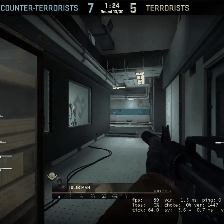

In [ ]:
test_video = np.random.choice(test_df["path"].values.tolist())

print(f"Test video path: {test_video}")
test_frames = sequence_prediction(test_video)
to_gif(test_frames[:MAX_SEQ_LENGTH])
display.Image(filename="new_model.gif", embed=True)

Test video path: /content/drive/MyDrive/sportals/dataset/test/Bad_Clips/CSGO_test4.mp4
Number of frames: 454
224
  Bad_Clips :1: 99.98%
  Good_Clips :0:  0.02%
224
  Bad_Clips :1: 99.03%
  Good_Clips :0:  0.97%
224
  Bad_Clips :1: 99.78%
  Good_Clips :0:  0.22%


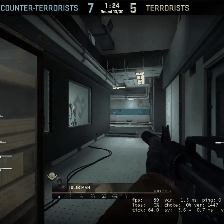

In [ ]:
# predict every 150 frames
test_video = np.random.choice(test_df["path"].values.tolist())
print(f"Test video path: {test_video}")
test_frames = frame_prediction(test_video, 150)
to_gif(test_frames)
display.Image(filename="new_model.gif",embed=True)